# Well and Grace Drought Analysis Code
Written by Danielle Tadych

 The purpose of this script is to analyze our master water level database and GRACE data for various types of drought. 

## Loading packages and files

In [1]:
import Custom_functions as cf
from optparse import Values
import os
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib.colors import ListedColormap
import datetime
from matplotlib.transforms import Bbox
import numpy as np
import pandas as pd
from shapely.geometry import box
import geopandas as gp
#import earthpy as et
import scipy.stats as sp
from scipy.stats import kendalltau, pearsonr, spearmanr
import pymannkendall as mk

# Data paths
datapath = '../Data/Input_files/'
outputpath = '../Data/Output_files/'
shapepath = '../Data/Shapefiles/'
figurepath = '../Data/Figures/'

In [105]:
# %%  ==== Reading in the data ====
filename_georeg = 'georeg_reproject_fixed.shp'
filepath = os.path.join(shapepath, filename_georeg)
georeg = gp.read_file(filepath)
# georeg.plot(cmap='viridis')

georeg['GEOREGI_NU'] = georeg['GEOREGI_NU'].astype('int64')
georeg.info()

# Importing GRACE analyses
filepath = filepath = datapath+'grace_stateavg_yearly.csv'
# filepath = outputpath_local+'gracse_remapped_yearly.csv'
grace_yearly = pd.read_csv(filepath, index_col=0)
grace_yearly = grace_yearly[:-1]

# Read in the annual time series database
filename_ts = 'Wells55_GWSI_WLTS_DB_annual_updated_thresh15.csv'
filepath = os.path.join(outputpath, filename_ts)
print(filepath)
annual_db = pd.read_csv(filepath, header=1, index_col=0)

annual_db = annual_db[1:168102]
annual_db.index.astype('int64')
annual_db2 = annual_db.reset_index(inplace=True)
annual_db2 = annual_db.rename(columns = {'year':'Combo_ID'})
annual_db2.head()

# For regulation
filepath = outputpath+'Waterlevels_Regulation_updated_thresh15.csv'
cat_wl2_reg = pd.read_csv(filepath, index_col=0)
cat_wl2_reg.head()

filepath = outputpath+'Waterlevels_Regulation_updated_MAX_thresh15.csv'
cat_wl2_reg_max = pd.read_csv(filepath, index_col=0)
cat_wl2_reg_max.head()

# For Access to SW
filepath = outputpath+'Waterlevels_AccesstoSW_updated_thresh15.csv'
cat_wl2_SW = pd.read_csv(filepath, index_col=0)
cat_wl2_SW.head()

filepath = outputpath+'Waterlevels_AccesstoSW_updated_MAX_thresh15.csv'
cat_wl2_SW_max = pd.read_csv(filepath, index_col=0)
cat_wl2_SW_max.head()

# Read in the drought indices
drought_indices = pd.read_csv(outputpath+'Yearly_DroughtIndices.csv')
drought_indices = drought_indices.set_index('In_year')
# drought_indices

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   GEO_Region  11 non-null     object  
 1   GEOREGI_NU  11 non-null     int64   
 2   Water_CAT   11 non-null     object  
 3   Loc         11 non-null     object  
 4   Regulation  11 non-null     object  
 5   geometry    11 non-null     geometry
dtypes: geometry(1), int64(1), object(4)
memory usage: 656.0+ bytes
../Data/Output_files/Wells55_GWSI_WLTS_DB_annual_updated_thresh15.csv


In [9]:
# %% Creating colors
c_1 = '#8d5a99' # Reservation
c_2 = "#d7191c" # Regulated with CAP (Water Category Color)
c_3 = '#e77a47' # Regulated without CAP (Water Category Color)
c_4 = '#2cbe21' # Lower CO River - SW (Water Category Color)
c_5 = '#2f8c73' # Upper CO River - Mixed (Water Category Color)
c_6 = '#6db7e8' # SE - GW
c_7 = '#165782' # NW - GW (Water Category color)
c_8 = '#229ce8' # SC - GW
c_9 = '#1f78b4' # NE - GW
c_10 = '#41bf9e' # N - Mixed
c_11 = '#7adec4' # C - Mixed
drought_color = '#ffa6b8'
wet_color = '#b8d3f2'

reg_colors = [c_2,c_7]
georeg_colors = [c_1,c_2,c_3,c_4,c_5,c_6,c_7,c_8,c_9,c_10,c_11]
SW_colors = [c_2,c_3,c_4,c_5,c_7]

bar_watercatc = [c_2,c_3,c_4,c_5,c_7]


# Color blind palette
# https://jacksonlab.agronomy.wisc.edu/2016/05/23/15-level-colorblind-friendly-palette/
blind =["#000000","#004949","#009292","#ff6db6","#ffb6db",
 "#490092","#006ddb","#b66dff","#6db6ff","#b6dbff",
 "#920000","#924900","#db6d00","#24ff24","#ffff6d"]

# Matching new map

cap = '#C6652B'
# noCAP = '#EDE461' # This is one from the map
noCAP = '#CCC339' # This color but darker for lines
GWdom = '#3B76AF'
mixed = '#6EB2E4'
swdom = '#469B76'

## Analysis
Wanting to look at 
1) Maximum Drawdown compared to the trend 
2) Anomalies 
3) Recovery

Decided from the drought indices analysis that the cutoff value is -3 for severe droughts


In [47]:
# %% Drought dictionary
DROUGHT_YEARS = {
        # 1:[1989,1990]
        # ,2:[1996]
        3:[2002,2003]
        ,4:[2006,2007]
        ,5:[2012,2013,2014]
        ,6:[2018]}

print(DROUGHT_YEARS)

{3: [2002, 2003], 4: [2006, 2007], 5: [2012, 2013, 2014], 6: [2018]}


In [12]:
#%% Pre-drought
# PREDROUGHT_YEARS = {1:[1988]
#         ,2:[1995]
#         ,3:[2001]
#         ,4:[2005]
#         ,5:[2011]
#         ,6:[2017]}

PREDROUGHT_YEARS = {1:[*range(1975,1988,1)]
        ,2:[*range(1991,1995,1)]
        ,3:[*range(1997,2001,1)]
        ,4:[*range(2004,2005,1)]
        ,5:[*range(2006,2011,1)]
        ,6:[*range(2015,2017,1)]}

print(PREDROUGHT_YEARS)

{1: [1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987], 2: [1991, 1992, 1993, 1994], 3: [1997, 1998, 1999, 2000], 4: [2004], 5: [2006, 2007, 2008, 2009, 2010], 6: [2015, 2016]}


In [13]:
#%% Print the average PDSI and PHDI values

ds = drought_indices.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'
# wlanalysis_period

for x,y in DROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)


pdsi_avg = ds.groupby(['Status']).mean()
pdsi_avg

,PDSI,PHDI
Status,,
Drought 1,-2.281250,-2.974167
Drought 2,-4.137500,-4.137500
Drought 3,-4.109167,-4.109167
Drought 4,-3.658750,-3.658750
Drought 5,-3.164722,-3.164722
Drought 6,-3.342500,-4.258333
Normal-Wet,0.202024,0.335333


### GRACE Drought Analysis

In [70]:
# Enter min year and max year of timeframe
minyear = 2002
maxyear = 2020

# %% Figure out which water level database you want
cat_wl2 = grace_yearly.copy() 

# Water Analysis period
wlanalysis_period = cat_wl2[(cat_wl2.index>=minyear)&(cat_wl2.index<=maxyear)]
# del wlanalysis_period['Res']

# Narrowing the drought indice frame
drought_indices = drought_indices[(drought_indices.index>=minyear)&(drought_indices.index<=maxyear)]

For comparing to drought indices

In [71]:
# Some functions since it's not pulling from cf
def kendall_pval(x,y):
        return kendalltau(x,y)[1]
    
def pearsonr_pval(x,y):
        return pearsonr(x,y)[1]
    
def spearmanr_pval(x,y):
        return spearmanr(x,y)[1]

In [91]:
ds = wlanalysis_period
# If running a shifted correlation analysis,
#    change this to however many # years; 0 is no lag
lag = 0
indice = 'PDSI'

columns = ds.columns
column_list = ds.columns.tolist()

print('Kendall Correlation coefficient')
for i in column_list:
        # print(' '+i+':')
        print(' '+str(i)+':')
# To normalize the data 
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        print('  tau = ',round(df1.corr(df2, method='kendall'),3))
        print('  pval = ',round(df1.corr(df2, method=kendall_pval),4))

# %%
print('Spearman Correlation coefficient')
for i in column_list:
        print(' '+str(i)+':')
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        print('  rho = ',round(df1.corr(df2, method='spearman'),3))
        print('  pval = ',round(df1.corr(df2, method=spearmanr_pval),4))

# %%
print('Pearson Correlation coefficient')
for i in column_list:
        print(' '+str(i)+':')
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        r = df1.corr(df2, method='pearson')
        print('  rsq = ',round(r*r,3))
        print('  pval = ',round(df1.corr(df2, method=pearsonr_pval),4))

Kendall Correlation coefficient
 0:
  tau =  -0.088
  pval =  0.6288
Spearman Correlation coefficient
 0:
  rho =  -0.091
  pval =  0.7103
Pearson Correlation coefficient
 0:
  rsq =  0.003
  pval =  0.8179


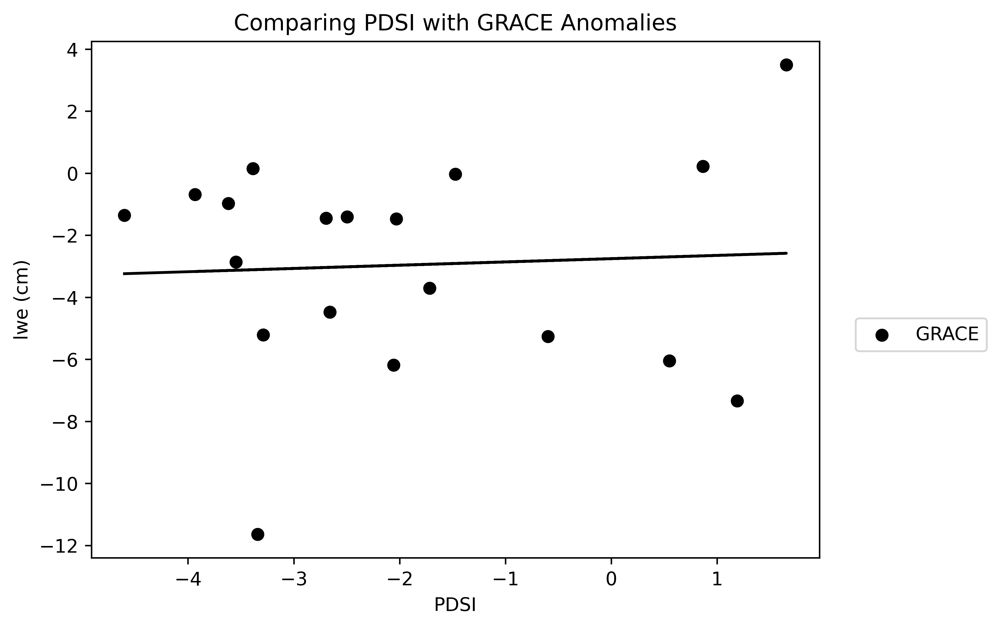

In [92]:
# %% Scatterplot of correlation values
ds = wlanalysis_period
# name = 'Comparing PDSI with Depth to Water by Access to SW'
name = 'Comparing '+indice+' with GRACE Anomalies'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()
# betterlabels = ['Receives CAP (Regulated)','GW Dominated (Regulated)','Surface Water Dominated','GW Dominated','Mixed Source'] 
betterlabels = ['GRACE'] 
colors=['black']
# colors=[cap,noCAP, swdom, mixed, GWdom]

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices[indice]
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel(indice)
ax.set_ylabel('lwe (cm)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

For Calculating Anomlies

In [93]:
# Anomaly's
ds = wlanalysis_period.copy()
columns = ds.columns
column_list = ds.columns.tolist()
trend_df = wlanalysis_period.copy()
dtw_anomalys = pd.DataFrame()
for i in column_list:
        # Subtracting against the mean
        # dtw_anomalys[i] = wlanalysis_period[i] - wlanalysis_period[i].mean()
        
        # Subtracting against the slope
        df = ds[i]
        y=np.array(df.values, dtype=float)
        x=np.array(pd.to_datetime(df).index.values, dtype=float)
        slope, intercept, r_value, p_value, std_err = sp.linregress(x,y)
        # print(y)
        # slope, intercept = sp.linregress(x,y) 
        trend_df[i] = (wlanalysis_period.index*slope) + intercept
        dtw_anomalys[i] = wlanalysis_period[i] - trend_df[i]
        

dtw_anomalys.head()

,0
year,
2002,-2.869896
2003,-1.989978
2004,-1.995851
2005,3.468227
2006,0.621912


In [95]:
ds = dtw_anomalys
# If running a shifted correlation analysis,
#    change this to however many # years; 0 is no lag
lag = 0
indice = 'PDSI'

columns = ds.columns
column_list = ds.columns.tolist()

print('Kendall Correlation coefficient')
for i in column_list:
        # print(' '+i+':')
        print(' '+str(i)+':')
# To normalize the data 
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        print('  tau = ',round(df1.corr(df2, method='kendall'),3))
        print('  pval = ',round(df1.corr(df2, method=kendall_pval),4))

# %%
print('Spearman Correlation coefficient')
for i in column_list:
        print(' '+str(i)+':')
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        print('  rho = ',round(df1.corr(df2, method='spearman'),3))
        print('  pval = ',round(df1.corr(df2, method=spearmanr_pval),4))

# %%
print('Pearson Correlation coefficient')
for i in column_list:
        print(' '+str(i)+':')
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        r = df1.corr(df2, method='pearson')
        print('  rsq = ',round(r*r,3))
        print('  pval = ',round(df1.corr(df2, method=pearsonr_pval),4))

Kendall Correlation coefficient
 0:
  tau =  0.404
  pval =  0.0158
Spearman Correlation coefficient
 0:
  rho =  0.535
  pval =  0.0182
Pearson Correlation coefficient
 0:
  rsq =  0.331
  pval =  0.0099


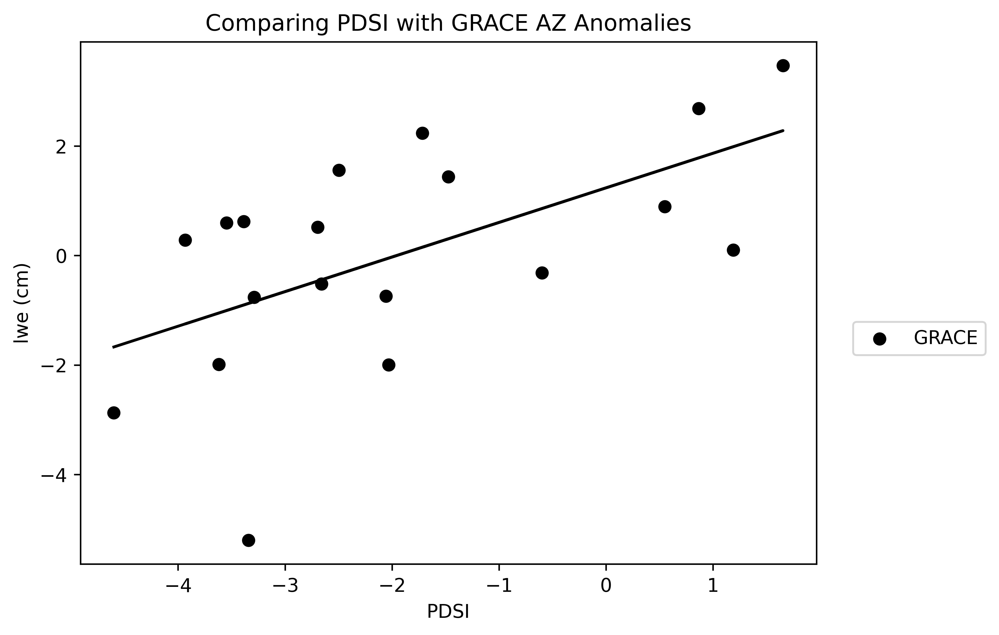

In [94]:
# %% Scatterplot of correlation values
ds = dtw_anomalys
# name = 'Comparing PDSI with Depth to Water by Access to SW'
name = 'Comparing '+indice+' with GRACE AZ Anomalies'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()


fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices[indice]
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel(indice)
ax.set_ylabel('lwe (cm)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

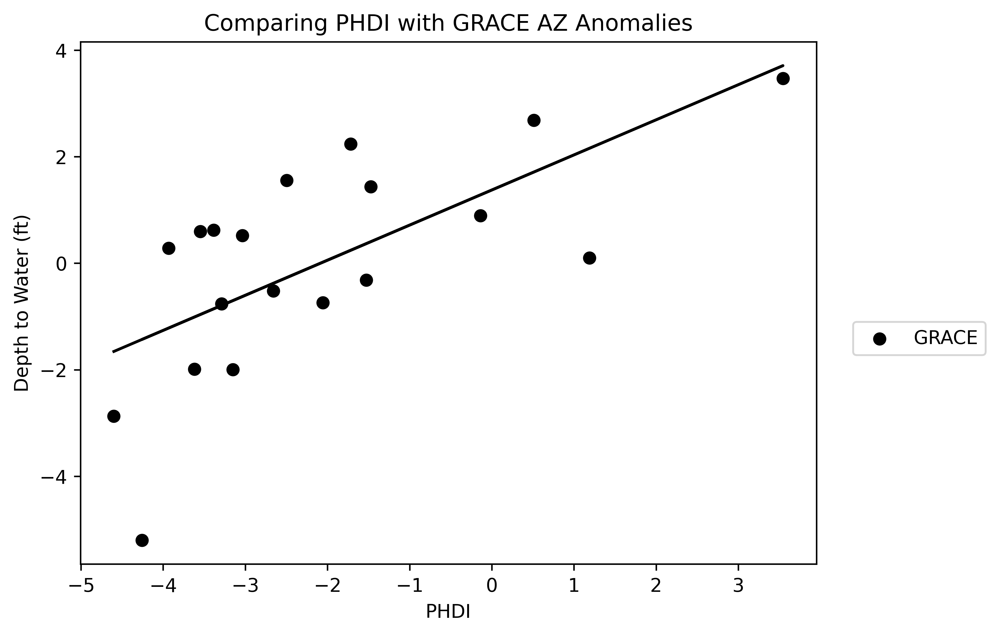

In [79]:
# Doing this for PHDI
indice = 'PHDI'
# %% Scatterplot of correlation values

ds = dtw_anomalys
# name = 'Comparing PDSI with Depth to Water by Access to SW'
name = 'Comparing '+indice+' with GRACE AZ Anomalies'

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices[indice]
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel(indice)
ax.set_ylabel('Depth to Water (ft)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

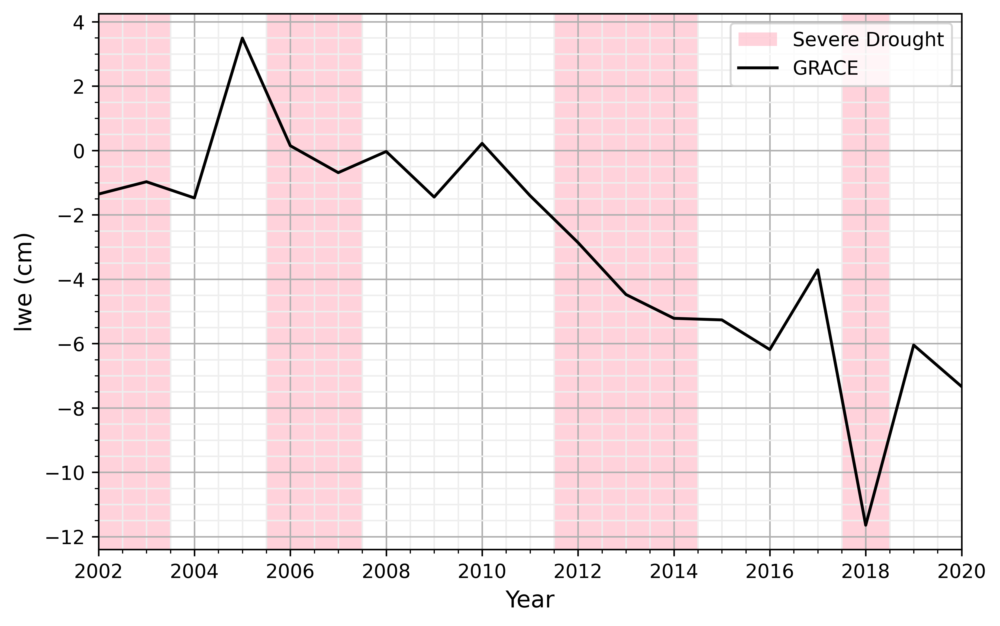

In [98]:
# For Depth to Water by regulation
ds = wlanalysis_period
min_yr = 2002
mx_yr = 2020

fig, ax = plt.subplots(1, 1, figsize = (8,5))

min_y = 75
max_y = 300
fsize = 12

# Drought Year Shading
a = 1988.5
b = 1990.5
c = 1995.5
d = 1996.5
# e = 1999.5
# f = 2000.5
g = 2001.5
h = 2003.5
i = 2005.5
j = 2007.5
k = 2011.5
l = 2014.5
m = 2017.5
n = 2018.5
plt.axvspan(a, b, color=drought_color, alpha=0.5, lw=0
            , label="Severe Drought"
            )
plt.axvspan(c, d, color=drought_color, alpha=0.5, lw=0)
# plt.axvspan(e, f, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(g, h, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(i, j, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(k, l, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(m, n, color=drought_color, alpha=0.5, lw=0)

ax.plot(ds['0'], label='GRACE', color='black') 

ax.set_xlim(min_yr,mx_yr)
# ax.set_ylim(min_y,max_y)
# ax.grid(True)
ax.grid(visible=True,which='major')
ax.grid(which='minor',color='#EEEEEE', lw=0.8)
ax.set_xlabel('Year', fontsize=fsize)
ax.set_ylabel('lwe (cm)',fontsize=fsize)
ax.minorticks_on()
fig.set_dpi(600.0)
# ax.set_title('a)',loc='left',pad=15)
ax.legend(loc='upper right')

#Putting Grace on a secondary axis
# ax2 = ax.twinx()
# ax2.plot(grace_yearly['0'], label='State Average LWE', color='k',zorder=1)
# ax2.set_ylim([15, -15])
# ax2.set_ylabel(u'Δ LWE (cm)',fontsize=fsize)
# ax2.legend(loc='lower right')

# plt.savefig(figurepath+'Timeseries of GRACE', bbox_inches = 'tight')

Creating a timeseries plot of anomalies

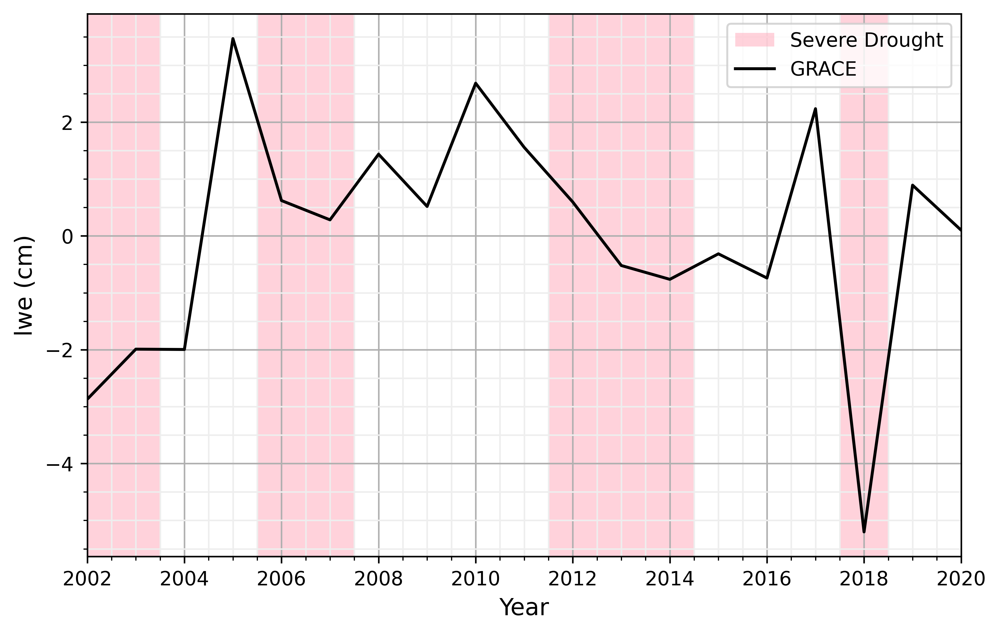

In [99]:
# For Depth to Water by regulation
ds = dtw_anomalys
min_yr = 2002
mx_yr = 2020

fig, ax = plt.subplots(1, 1, figsize = (8,5))

min_y = 75
max_y = 300
fsize = 12

# Drought Year Shading
a = 1988.5
b = 1990.5
c = 1995.5
d = 1996.5
# e = 1999.5
# f = 2000.5
g = 2001.5
h = 2003.5
i = 2005.5
j = 2007.5
k = 2011.5
l = 2014.5
m = 2017.5
n = 2018.5
plt.axvspan(a, b, color=drought_color, alpha=0.5, lw=0
            , label="Severe Drought"
            )
plt.axvspan(c, d, color=drought_color, alpha=0.5, lw=0)
# plt.axvspan(e, f, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(g, h, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(i, j, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(k, l, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(m, n, color=drought_color, alpha=0.5, lw=0)

ax.plot(ds['0'], label='GRACE', color='black') 

ax.set_xlim(min_yr,mx_yr)
# ax.set_ylim(min_y,max_y)
# ax.grid(True)
ax.grid(visible=True,which='major')
ax.grid(which='minor',color='#EEEEEE', lw=0.8)
ax.set_xlabel('Year', fontsize=fsize)
ax.set_ylabel('lwe (cm)',fontsize=fsize)
ax.minorticks_on()
fig.set_dpi(600.0)
# ax.set_title('a)',loc='left',pad=15)
ax.legend(loc='upper right')

#Putting Grace on a secondary axis
# ax2 = ax.twinx()
# ax2.plot(grace_yearly['0'], label='State Average LWE', color='k',zorder=1)
# ax2.set_ylim([15, -15])
# ax2.set_ylabel(u'Δ LWE (cm)',fontsize=fsize)
# ax2.legend(loc='lower right')

plt.savefig(figurepath+'Timeseries of DTW AZ Specific Anomalies', bbox_inches = 'tight')

In [85]:
# %% Average Anomalie for drought periods
ds = dtw_anomalys.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'
# wlanalysis_period

for x,y in DROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)


dtw_mean_anomalies = ds.groupby(['Status']).mean()
dtw_mean_anomalies
# ds

,0
Status,
Drought 3,-2.429937
Drought 4,0.452405
Drought 5,-0.228671
Drought 6,-5.201791
Normal-Wet,0.894806


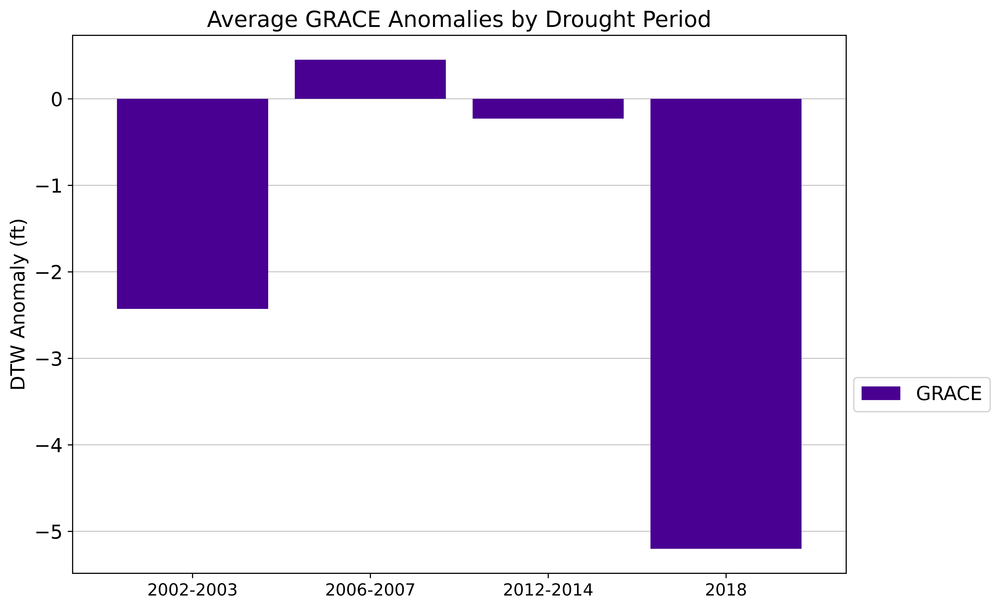

In [86]:
#%% Grouped Bar chart for drawdown (ft)
name = 'Average GRACE Anomalies by Drought Period'
# name = 'Max Drawdown by Drought Period and Access to SW'

yearlabels = [
        # "1989-1990",
        # '1996',
        '2002-2003',
        '2006-2007',
        '2012-2014',
        '2018',
        'Normal/Wet Years']

dtw_mean_anomalies.index = yearlabels
dtw_mean_anomalies = dtw_mean_anomalies.transpose()

dtw_mean_anomalies.index = betterlabels
del dtw_mean_anomalies['Normal/Wet Years']
dtw_mean_anomalies = dtw_mean_anomalies.transpose()


# group_colors = ['lightsalmon','tomato','orangered','r','brown','indianred','steelblue']

group_colors = [blind[5],blind[6],blind[2]
                ,blind[12],blind[11],blind[10]
                # ,blind[0] #black
                ]

horlabel = 'DTW Anomaly (ft)'
fsize = 14

plt.rcParams["figure.dpi"] = 600
dtw_mean_anomalies.plot(figsize = (10,7),
        kind='bar',
        stacked=False,
        # title=name,
        color = group_colors,
        zorder = 2,
        width = 0.85,
        fontsize = fsize
        )
plt.title(name, fontsize = (fsize+2))
# plt.ylim([0,400])
plt.ylabel(horlabel, fontsize = fsize)
plt.xticks(rotation=0, fontsize = fsize-2)
plt.grid(axis='y', linewidth=0.5, zorder=0)
plt.legend(loc=[1.01,0.3],fontsize = fsize)
# plt.set_dpi(600)

# plt.savefig(figurepath+name+'_groupedchart', bbox_inches = 'tight')
# plt.savefig(outputpath+name+'_anomalies_SWAccess_groupedchart', bbox_inches = 'tight')

For Max Drawdown

In [87]:
# %% Max drawdown
ds = dtw_anomalys.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'
# wlanalysis_period

for x,y in DROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)


drought_max = ds.groupby(['Status']).max()
drought_max

# ds

,0
Status,
Drought 3,-1.989978
Drought 4,0.621912
Drought 5,0.596740
Drought 6,-5.201791
Normal-Wet,3.468227


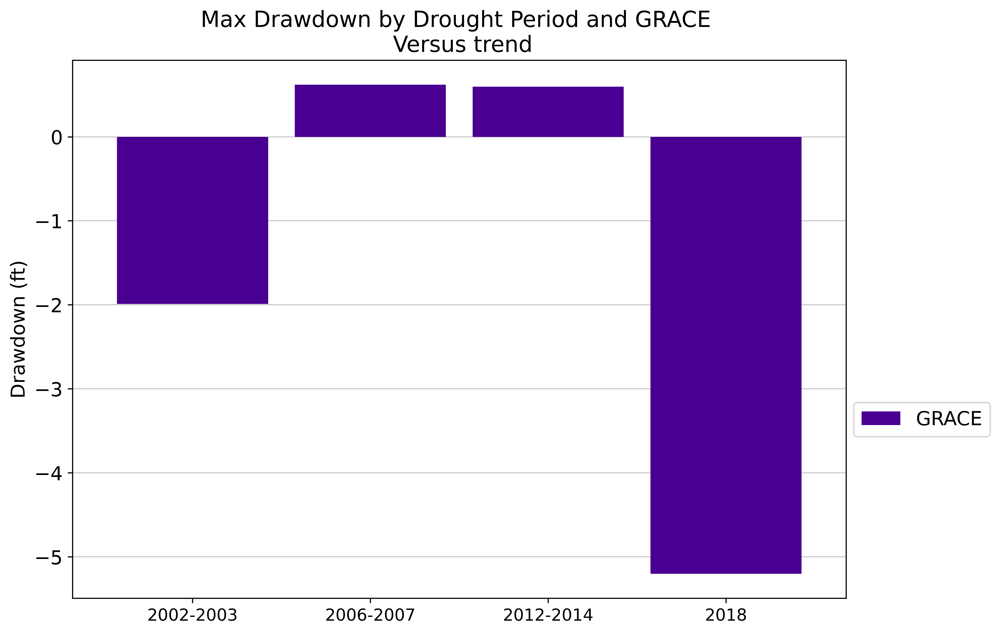

In [88]:
#%% Grouped Bar chart for drawdown (ft)
name = 'Max Drawdown by Drought Period and GRACE \n Versus trend'
# name = 'Max Drawdown by Drought Period and Access to SW'

drought_max.index = yearlabels
drought_max = drought_max.transpose()
drought_max
drought_max.index = betterlabels
del drought_max['Normal/Wet Years']
drought_max = drought_max.transpose()

# group_colors = ['lightsalmon','tomato','orangered','r','brown','indianred','steelblue']

group_colors = [blind[5],blind[6],blind[2]
                ,blind[12],blind[11],blind[10]
                # ,blind[0] #black
                ]

horlabel = 'Drawdown (ft)'
fsize = 14

plt.rcParams["figure.dpi"] = 600
drought_max.plot(figsize = (10,7),
        kind='bar',
        stacked=False,
        # title=name,
        color = group_colors,
        zorder = 2,
        width = 0.85,
        fontsize = fsize
        )
plt.title(name, fontsize = (fsize+2))
# plt.ylim([0,400])
plt.ylabel(horlabel, fontsize = fsize)
plt.xticks(rotation=0, fontsize = fsize-2)
plt.grid(axis='y', linewidth=0.5, zorder=0)
plt.legend(loc=[1.01,0.3],fontsize = fsize)
# plt.set_dpi(600)

# plt.savefig(figurepath+name+'_groupedchart', bbox_inches = 'tight')
# plt.savefig(outputpath+name+'_anomalies_SWAccess_groupedchart', bbox_inches = 'tight')

### Regulated versus Unregulated - Step by step

In [106]:
# Enter min year and max year of timeframe
minyear = 2000
maxyear = 2020

# %% Figure out which water level database you want
cat_wl2 = cat_wl2_reg.copy() 

# Water Analysis period
wlanalysis_period = cat_wl2[(cat_wl2.index>=minyear)&(cat_wl2.index<=maxyear)]
del wlanalysis_period['Res']

# Narrowing the drought indice frame
drought_indices = drought_indices[(drought_indices.index>=minyear)&(drought_indices.index<=maxyear)]

For comparing to drought indices

In [107]:
# Some functions since it's not pulling from cf
def kendall_pval(x,y):
        return kendalltau(x,y)[1]
    
def pearsonr_pval(x,y):
        return pearsonr(x,y)[1]
    
def spearmanr_pval(x,y):
        return spearmanr(x,y)[1]

In [108]:
ds = wlanalysis_period
# %% If running a shifted correlation analysis,
#    change this to however many # years; 0 is no lag
lag = 0
indice = 'PDSI'

columns = ds.columns
column_list = ds.columns.tolist()

ds = wlanalysis_period
print('Kendall Correlation coefficient')
for i in column_list:
        # print(' '+i+':')
        print(' '+str(i)+':')
# To normalize the data 
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        print('  tau = ',round(df1.corr(df2, method='kendall'),3))
        print('  pval = ',round(df1.corr(df2, method=kendall_pval),4))

# %%
print('Spearman Correlation coefficient')
for i in column_list:
        print(' '+str(i)+':')
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        print('  rho = ',round(df1.corr(df2, method='spearman'),3))
        print('  pval = ',round(df1.corr(df2, method=spearmanr_pval),4))

# %%
print('Pearson Correlation coefficient')
for i in column_list:
        print(' '+str(i)+':')
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices[indice].shift(lag)
        r = df1.corr(df2, method='pearson')
        print('  rsq = ',round(r*r,3))
        print('  pval = ',round(df1.corr(df2, method=pearsonr_pval),4))

Kendall Correlation coefficient
 R:
  tau =  -0.257
  pval =  0.1101
 U:
  tau =  0.038
  pval =  0.8347
Spearman Correlation coefficient
 R:
  rho =  -0.391
  pval =  0.0797
 U:
  rho =  0.062
  pval =  0.7884
Pearson Correlation coefficient
 R:
  rsq =  0.114
  pval =  0.1346
 U:
  rsq =  0.017
  pval =  0.5679


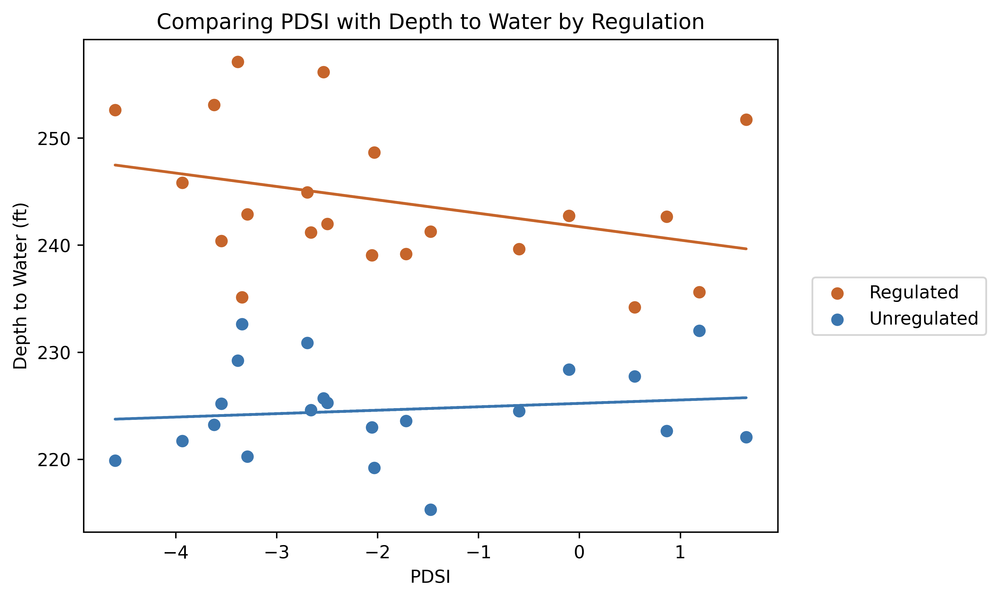

In [109]:
# %% Scatterplot of correlation values
ds = wlanalysis_period
# name = 'Comparing PDSI with Depth to Water by Access to SW'
name = 'Comparing '+indice+' with Depth to Water by Regulation'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()
# betterlabels = ['Receives CAP (Regulated)','GW Dominated (Regulated)','Surface Water Dominated','GW Dominated','Mixed Source'] 
betterlabels = ['Regulated','Unregulated'] 
colors=[cap, GWdom]
# colors=[cap,noCAP, swdom, mixed, GWdom]

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices[indice]
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel(indice)
ax.set_ylabel('Depth to Water (ft)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

For Calculating Anomlies

In [110]:
# Anomaly's
ds = wlanalysis_period.copy()
columns = ds.columns
column_list = ds.columns.tolist()
trend_df = wlanalysis_period.copy()
dtw_anomalys = pd.DataFrame()
for i in column_list:
        # Subtracting against the mean
        # dtw_anomalys[i] = wlanalysis_period[i] - wlanalysis_period[i].mean()
        
        # Subtracting against the slope
        df = ds[i]
        y=np.array(df.values, dtype=float)
        x=np.array(pd.to_datetime(df).index.values, dtype=float)
        slope, intercept, r_value, p_value, std_err = sp.linregress(x,y)
        # print(y)
        # slope, intercept = sp.linregress(x,y) 
        trend_df[i] = (wlanalysis_period.index*slope) + intercept
        dtw_anomalys[i] = wlanalysis_period[i] - trend_df[i]
        

dtw_anomalys.head()

,R,U
index,,
2000,2.802871,3.467426
2001,-9.702516,5.921020
2002,1.108707,-2.835180
2003,2.517005,0.270750
2004,-1.001362,-3.976933


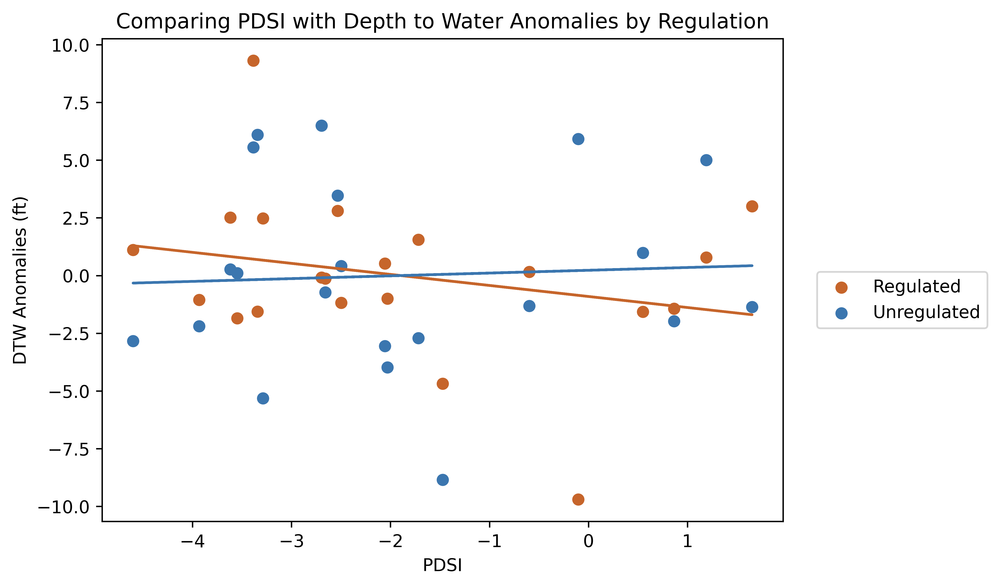

In [112]:
# %% Scatterplot of correlation values
ds = dtw_anomalys
# name = 'Comparing PDSI with Depth to Water by Access to SW'
name = 'Comparing '+indice+' with Depth to Water Anomalies by Regulation'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()
# betterlabels = ['Receives CAP (Regulated)','GW Dominated (Regulated)','Surface Water Dominated','GW Dominated','Mixed Source'] 
betterlabels = ['Regulated','Unregulated'] 
colors=[cap, GWdom]
# colors=[cap,noCAP, swdom, mixed, GWdom]

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices[indice]
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel(indice)
ax.set_ylabel('DTW Anomalies (ft)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

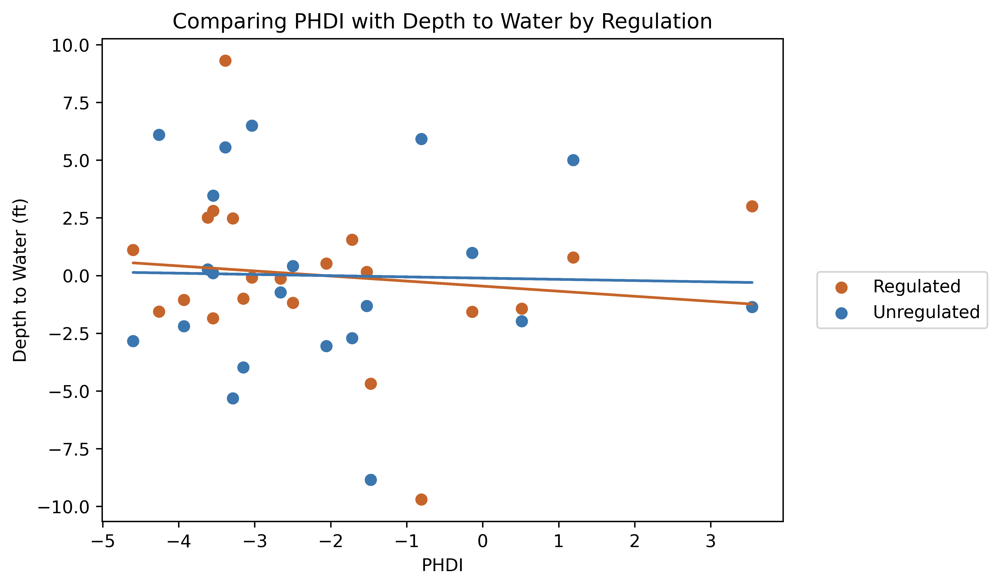

In [33]:
# Doing this for PHDI
indice = 'PHDI'
# %% Scatterplot of correlation values

ds = dtw_anomalys
# name = 'Comparing PDSI with Depth to Water by Access to SW'
name = 'Comparing '+indice+' with Depth to Water by Regulation'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()
# betterlabels = ['Receives CAP (Regulated)','GW Dominated (Regulated)','Surface Water Dominated','GW Dominated','Mixed Source'] 
betterlabels = ['Regulated','Unregulated'] 
colors=[cap, GWdom]
# colors=[cap,noCAP, swdom, mixed, GWdom]

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices[indice]
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel(indice)
ax.set_ylabel('Depth to Water (ft)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

Creating a timeseries plot of anomalies

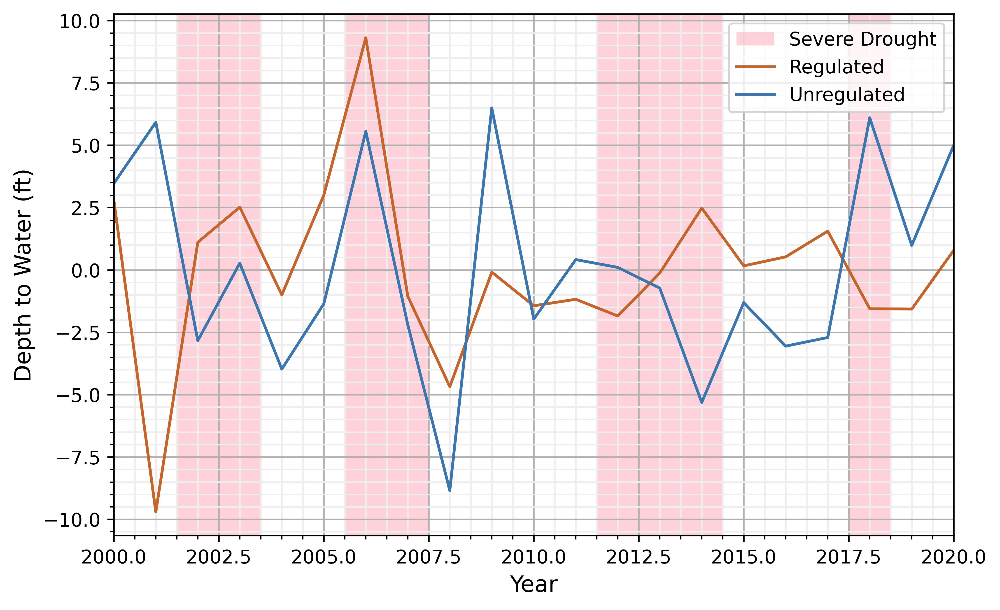

In [35]:
# For Depth to Water by regulation
ds = dtw_anomalys
min_yr = 2000
mx_yr = 2020
betterlabels = ['Regulated','Unregulated'] 

fig, ax = plt.subplots(1, 1, figsize = (8,5))

min_y = 75
max_y = 300
fsize = 12

# Drought Year Shading
a = 1988.5
b = 1990.5
c = 1995.5
d = 1996.5
# e = 1999.5
# f = 2000.5
g = 2001.5
h = 2003.5
i = 2005.5
j = 2007.5
k = 2011.5
l = 2014.5
m = 2017.5
n = 2018.5
plt.axvspan(a, b, color=drought_color, alpha=0.5, lw=0
            , label="Severe Drought"
            )
plt.axvspan(c, d, color=drought_color, alpha=0.5, lw=0)
# plt.axvspan(e, f, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(g, h, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(i, j, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(k, l, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(m, n, color=drought_color, alpha=0.5, lw=0)

ax.plot(ds['R'], label='Regulated', color=cap) 
ax.plot(ds['U'], label='Unregulated', color=GWdom) 

ax.set_xlim(min_yr,mx_yr)
# ax.set_ylim(min_y,max_y)
# ax.grid(True)
ax.grid(visible=True,which='major')
ax.grid(which='minor',color='#EEEEEE', lw=0.8)
ax.set_xlabel('Year', fontsize=fsize)
ax.set_ylabel('Depth to Water (ft)',fontsize=fsize)
ax.minorticks_on()
fig.set_dpi(600.0)
# ax.set_title('a)',loc='left',pad=15)
ax.legend(loc='upper right')

#Putting Grace on a secondary axis
# ax2 = ax.twinx()
# ax2.plot(grace_yearly['0'], label='State Average LWE', color='k',zorder=1)
# ax2.set_ylim([15, -15])
# ax2.set_ylabel(u'Δ LWE (cm)',fontsize=fsize)
# ax2.legend(loc='lower right')

plt.savefig(figurepath+'Timeseries of DTW Anomalies for Regulation', bbox_inches = 'tight')

In [42]:
maxdf = cat_wl2_reg_max.copy()
del maxdf['Res']
maxdf

,R,U
index,,
1853,NaN,NaN
1856,NaN,NaN
1857,NaN,NaN
1860,NaN,NaN
1864,NaN,NaN
...,...,...
2019,235.581792,228.719690
2020,236.462547,233.393128
2021,239.281495,241.058243


In [44]:
maxdf = cat_wl2_reg_max.copy()
del maxdf['Res']
maxdf = maxdf.reset_index()
maxdf['index'] = maxdf['index'].astype(int)
maxdf.set_index('index', inplace=True)
maxdf.info()
# maxdf

<class 'pandas.core.frame.DataFrame'>
Index: 159 entries, 1853 to 2023
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   R       104 non-null    float64
 1   U       103 non-null    float64
dtypes: float64(2)
memory usage: 3.1 KB


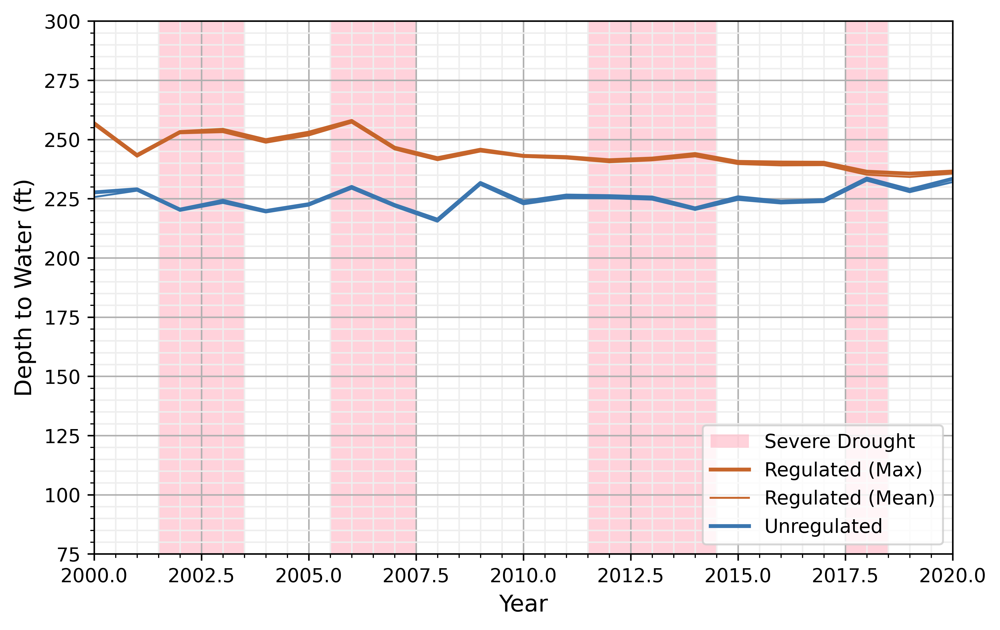

In [45]:
# For Depth to Water by regulation
ds = maxdf
min_yr = 2000
mx_yr = 2020
betterlabels = ['Regulated','Unregulated'] 

fig, ax = plt.subplots(1, 1, figsize = (8,5))

min_y = 75
max_y = 300
fsize = 12

# Drought Year Shading
a = 1988.5
b = 1990.5
c = 1995.5
d = 1996.5
# e = 1999.5
# f = 2000.5
g = 2001.5
h = 2003.5
i = 2005.5
j = 2007.5
k = 2011.5
l = 2014.5
m = 2017.5
n = 2018.5
plt.axvspan(a, b, color=drought_color, alpha=0.5, lw=0
            , label="Severe Drought"
            )
plt.axvspan(c, d, color=drought_color, alpha=0.5, lw=0)
# plt.axvspan(e, f, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(g, h, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(i, j, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(k, l, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(m, n, color=drought_color, alpha=0.5, lw=0)

ax.plot(ds['R'], label='Regulated (Max)', color=cap,lw = 2) 
ax.plot(wlanalysis_period['R'], label='Regulated (Mean)', color=cap,lw = 1) 
ax.plot(ds['U'], label='Unregulated', color=GWdom, lw = 2) 
ax.plot(wlanalysis_period['U'], label='', color=GWdom, lw = 1) 

ax.set_xlim(min_yr,mx_yr)
ax.set_ylim(min_y,max_y)
# ax.grid(True)
ax.grid(visible=True,which='major')
ax.grid(which='minor',color='#EEEEEE', lw=0.8)
ax.set_xlabel('Year', fontsize=fsize)
ax.set_ylabel('Depth to Water (ft)',fontsize=fsize)
ax.minorticks_on()
fig.set_dpi(600.0)
# ax.set_title('a)',loc='left',pad=15)
ax.legend(loc='lower right')

#Putting Grace on a secondary axis
# ax2 = ax.twinx()
# ax2.plot(grace_yearly['0'], label='State Average LWE', color='k',zorder=1)
# ax2.set_ylim([15, -15])
# ax2.set_ylabel(u'Δ LWE (cm)',fontsize=fsize)
# ax2.legend(loc='lower right')

plt.savefig(figurepath+'Timeseries Max versus mean Regulation', bbox_inches = 'tight')

In [177]:
# %% Average Anomalie for drought periods
ds = dtw_anomalys.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'
# wlanalysis_period

for x,y in DROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)


dtw_mean_anomalies = ds.groupby(['Status']).mean()
dtw_mean_anomalies
# ds

,R,U
Status,,
Drought 1,-17.979316,-9.114450
Drought 2,-34.211052,-27.311164
Drought 3,27.652019,9.912070
Drought 4,9.221969,12.027516
Drought 5,-2.576413,5.519885
Drought 6,11.266108,12.547603
Normal-Wet,-0.203290,-0.784182


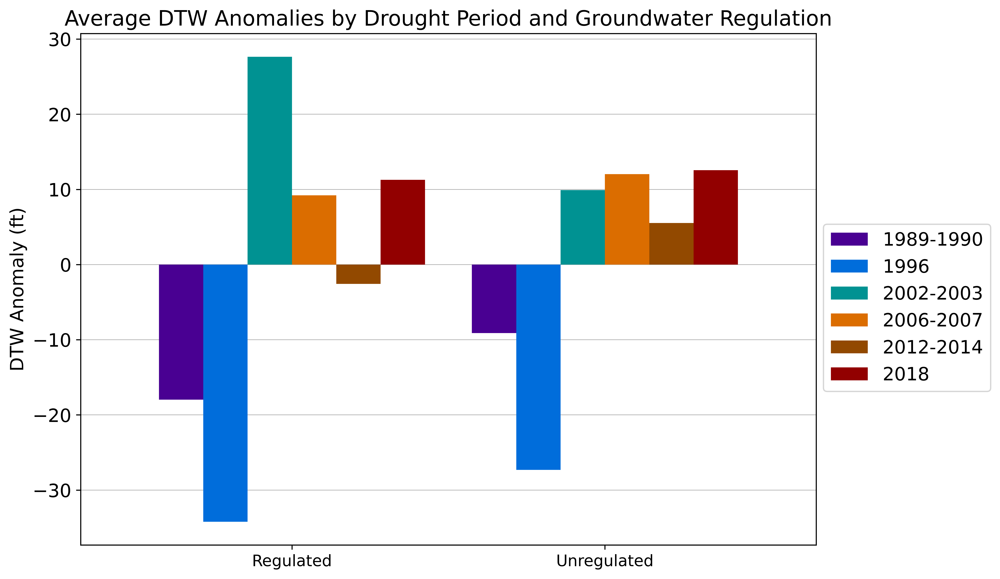

In [156]:
#%% Grouped Bar chart for drawdown (ft)
name = 'Average DTW Anomalies by Drought Period and Groundwater Regulation'
# name = 'Max Drawdown by Drought Period and Access to SW'

yearlabels = ["1989-1990",'1996','2002-2003','2006-2007','2012-2014','2018','Normal/Wet Years']
# betterlabels = ['CAP','Regulated \n Groundwater','Surface \n Water','Unregulated \n Groundwater','Mixed \n GW/SW'] 
betterlabels = ['Regulated','Unregulated']

dtw_mean_anomalies.index = yearlabels
dtw_mean_anomalies = dtw_mean_anomalies.transpose()

dtw_mean_anomalies.index = betterlabels
del dtw_mean_anomalies['Normal/Wet Years']
dtw_mean_anomalies


# group_colors = ['lightsalmon','tomato','orangered','r','brown','indianred','steelblue']

group_colors = [blind[5],blind[6],blind[2]
                ,blind[12],blind[11],blind[10]
                # ,blind[0] #black
                ]

horlabel = 'DTW Anomaly (ft)'
fsize = 14

plt.rcParams["figure.dpi"] = 600
dtw_mean_anomalies.plot(figsize = (10,7),
        kind='bar',
        stacked=False,
        # title=name,
        color = group_colors,
        zorder = 2,
        width = 0.85,
        fontsize = fsize
        )
plt.title(name, fontsize = (fsize+2))
# plt.ylim([0,400])
plt.ylabel(horlabel, fontsize = fsize)
plt.xticks(rotation=0, fontsize = fsize-2)
plt.grid(axis='y', linewidth=0.5, zorder=0)
plt.legend(loc=[1.01,0.3],fontsize = fsize)
# plt.set_dpi(600)

plt.savefig(figurepath+name+'_groupedchart', bbox_inches = 'tight')
# plt.savefig(outputpath+name+'_anomalies_SWAccess_groupedchart', bbox_inches = 'tight')

For Max Drawdown

In [53]:
# %% Max drawdown
ds = dtw_anomalys.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'
# wlanalysis_period

for x,y in DROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)


drought_max = ds.groupby(['Status']).max()
drought_max

# ds

,R,U
Status,,
Drought 3,2.517005,0.270750
Drought 4,9.309019,5.558563
Drought 5,2.479189,0.101379
Drought 6,-1.557118,6.102082
Normal-Wet,2.997534,6.494348


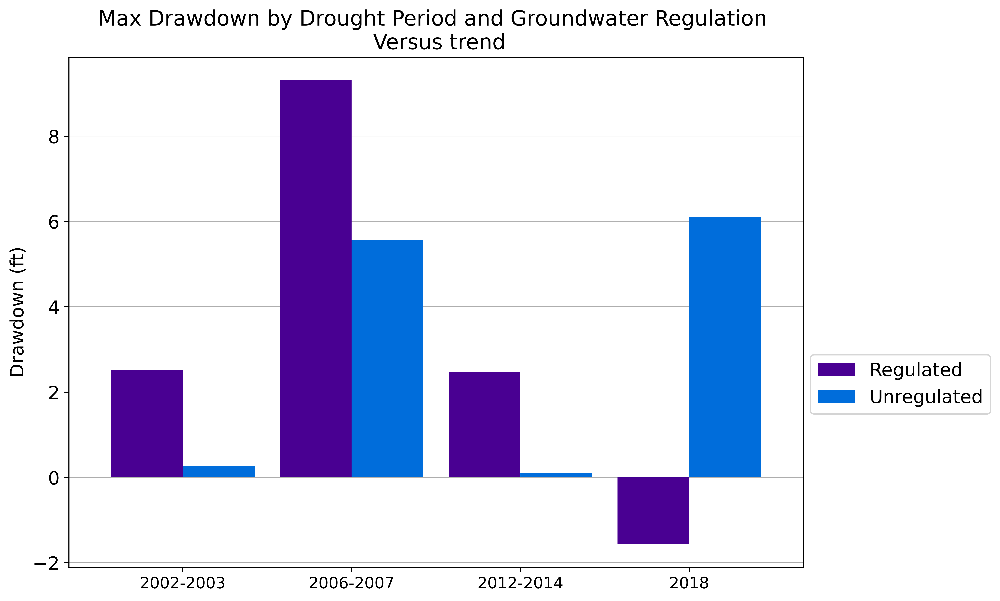

In [54]:
#%% Grouped Bar chart for drawdown (ft)
name = 'Max Drawdown by Drought Period and Groundwater Regulation \n Versus trend'
# name = 'Max Drawdown by Drought Period and Access to SW'

drought_max.index = yearlabels
drought_max = drought_max.transpose()
drought_max
drought_max.index = betterlabels
del drought_max['Normal/Wet Years']
drought_max = drought_max.transpose()

# group_colors = ['lightsalmon','tomato','orangered','r','brown','indianred','steelblue']

group_colors = [blind[5],blind[6],blind[2]
                ,blind[12],blind[11],blind[10]
                # ,blind[0] #black
                ]

horlabel = 'Drawdown (ft)'
fsize = 14

plt.rcParams["figure.dpi"] = 600
drought_max.plot(figsize = (10,7),
        kind='bar',
        stacked=False,
        # title=name,
        color = group_colors,
        zorder = 2,
        width = 0.85,
        fontsize = fsize
        )
plt.title(name, fontsize = (fsize+2))
# plt.ylim([0,400])
plt.ylabel(horlabel, fontsize = fsize)
plt.xticks(rotation=0, fontsize = fsize-2)
plt.grid(axis='y', linewidth=0.5, zorder=0)
plt.legend(loc=[1.01,0.3],fontsize = fsize)
# plt.set_dpi(600)

# plt.savefig(figurepath+name+'_groupedchart', bbox_inches = 'tight')
# plt.savefig(outputpath+name+'_anomalies_SWAccess_groupedchart', bbox_inches = 'tight')

### For Access to Surface Water

In [183]:
cat_wl2 = cat_wl2_SW.copy()

wlanalysis_period = cat_wl2[cat_wl2.index>=1975]

For comparing to drought indices

In [184]:
# Some functions since it's not pulling from cf
def kendall_pval(x,y):
        return kendalltau(x,y)[1]
    
def pearsonr_pval(x,y):
        return pearsonr(x,y)[1]
    
def spearmanr_pval(x,y):
        return spearmanr(x,y)[1]

In [185]:

# %% If running a shifted correlation analysis,
#    change this to however many # years; 0 is no lag
lag = 0

ds = wlanalysis_period
columns = ds.columns
column_list = ds.columns.tolist()

print('Kendall Correlation coefficient')
for i in column_list:
        # print(' '+i+':')
        print(' '+str(i)+':')
# To normalize the data 
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices.PDSI.shift(lag)
        print('  tau = ',round(df1.corr(df2, method='kendall'),3))
        print('  pval = ',round(df1.corr(df2, method=kendall_pval),4))

# %%
print('Spearman Correlation coefficient')
for i in column_list:
        print(' '+str(i)+':')
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices.PDSI.shift(lag)
        print('  rho = ',round(df1.corr(df2, method='spearman'),3))
        print('  pval = ',round(df1.corr(df2, method=spearmanr_pval),4))

# %%
print('Pearson Correlation coefficient')
for i in column_list:
        print(' '+str(i)+':')
        # df1 = ds[i].pct_change()
        # df2 = drought_indices.PDSI.pct_change()
        df1 = ds[i]
        df2 = drought_indices.PDSI.shift(lag)
        r = df1.corr(df2, method='pearson')
        print('  rsq = ',round(r*r,3))
        print('  pval = ',round(df1.corr(df2, method=pearsonr_pval),4))

Kendall Correlation coefficient
 CAP:
  tau =  -0.235
  pval =  0.0214
 No_CAP:
  tau =  -0.331
  pval =  0.0012
 SW:
  tau =  -0.146
  pval =  0.1528
 GW:
  tau =  -0.308
  pval =  0.0025
 Mix:
  tau =  -0.235
  pval =  0.0214
Spearman Correlation coefficient
 CAP:
  rho =  -0.335
  pval =  0.0227
 No_CAP:
  rho =  -0.459
  pval =  0.0013
 SW:
  rho =  -0.208
  pval =  0.1664
 GW:
  rho =  -0.433
  pval =  0.0027
 Mix:
  rho =  -0.348
  pval =  0.0177
Pearson Correlation coefficient
 CAP:
  rsq =  0.107
  pval =  0.0262
 No_CAP:
  rsq =  0.225
  pval =  0.0009
 SW:
  rsq =  0.063
  pval =  0.0928
 GW:
  rsq =  0.208
  pval =  0.0014
 Mix:
  rsq =  0.128
  pval =  0.0147


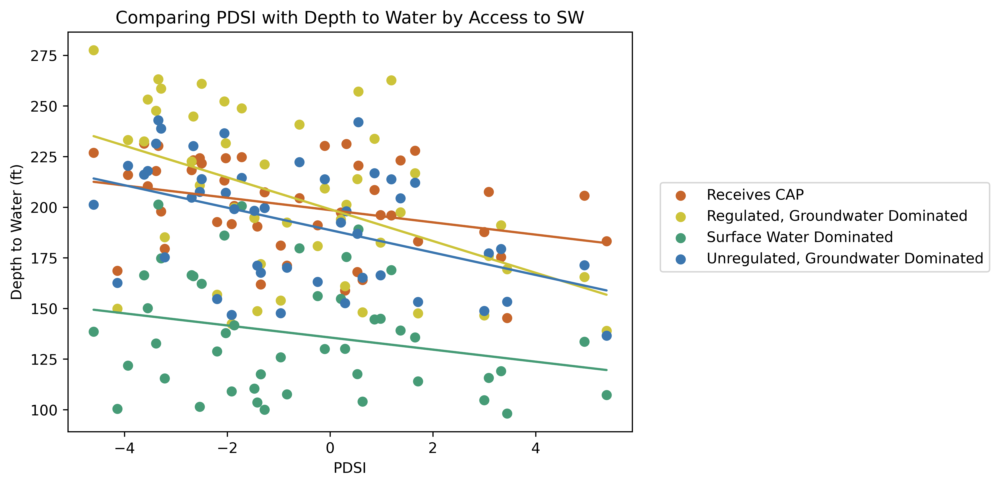

In [186]:
# %% Scatterplot of correlation values
ds = wlanalysis_period
name = 'Comparing PDSI with Depth to Water by Access to SW'
# name = 'Comparing PDSI with Depth to Water by Regulation'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()
# betterlabels = ['Receives CAP (Regulated)','GW Dominated (Regulated)','Surface Water Dominated','GW Dominated','Mixed Source'] 
betterlabels = ['Receives CAP'
                ,'Regulated, Groundwater Dominated'
                ,'Surface Water Dominated'
                ,'Unregulated, Groundwater Dominated'
                # ,'Mixed \n GW/SW'
                ]
colors=[cap
        ,noCAP
        , swdom
        , GWdom
        # , mixed
        ]

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices['PDSI']
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel('PDSI')
ax.set_ylabel('Depth to Water (ft)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

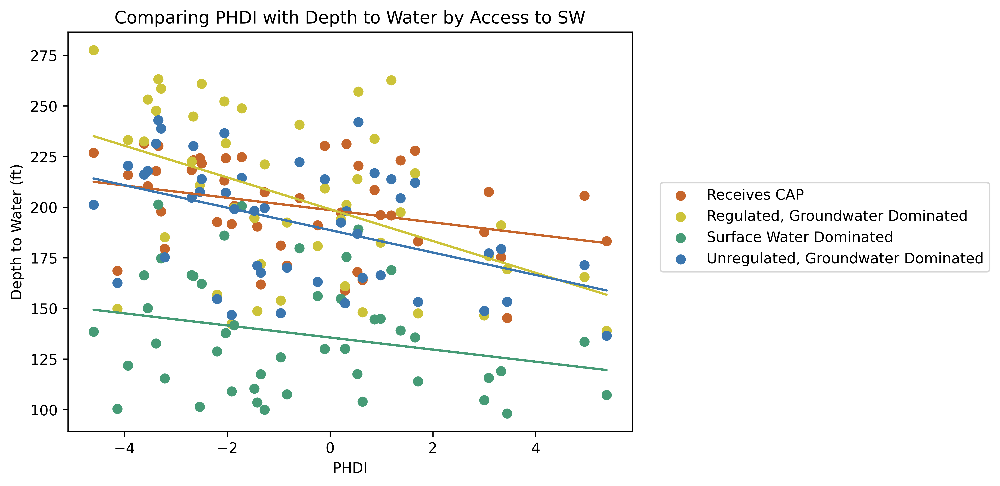

In [187]:
# %% Scatterplot of correlation values
ds = wlanalysis_period
name = 'Comparing PHDI with Depth to Water by Access to SW'
# name = 'Comparing PDSI with Depth to Water by Regulation'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()
# betterlabels = ['Receives CAP (Regulated)','GW Dominated (Regulated)','Surface Water Dominated','GW Dominated','Mixed Source'] 
betterlabels = ['Receives CAP'
                ,'Regulated, Groundwater Dominated'
                ,'Surface Water Dominated'
                ,'Unregulated, Groundwater Dominated'
                # ,'Mixed \n GW/SW'
                ]
colors=[cap
        ,noCAP
        , swdom
        , GWdom
        # , mixed
        ]

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices['PDSI']
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel('PHDI')
ax.set_ylabel('Depth to Water (ft)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

In [188]:
# 1. Anomaly's
ds = wlanalysis_period.copy()
columns = ds.columns
column_list = ds.columns.tolist()

dtw_anomalys = pd.DataFrame()
for i in column_list:
        # Subtracting against the mean
        # dtw_anomalys[i] = wlanalysis_period[i] - wlanalysis_period[i].mean()
        
        # Subtracting against the slope
        df = ds[i]
        y=np.array(df.values, dtype=float)
        x=np.array(pd.to_datetime(df).index.values, dtype=float)
        slope, intercept, r_value, p_value, std_err = sp.linregress(x,y)
        # print(y)
        # slope, intercept = sp.linregress(x,y) 
        # dtw_anomalys[i] = wlanalysis_period[i] - ((wlanalysis_period.index*slope) + intercept)
        trend_df[i] = (wlanalysis_period.index*slope) + intercept
        dtw_anomalys[i] = wlanalysis_period[i] - trend_df[i]

dtw_anomalys.head()

,CAP,No_CAP,SW,GW,Mix
index,,,,,
1975,9.489852,4.751971,-2.817320,23.251850,31.072047
1976,-0.742255,7.300901,18.089135,-2.210931,10.230360
1977,8.942278,-6.923439,-0.054996,-5.078967,-8.469690
1978,4.180501,-5.399983,-5.865916,-5.122919,-4.651288
1979,-1.232067,-15.729300,-4.660442,-19.256845,2.902123


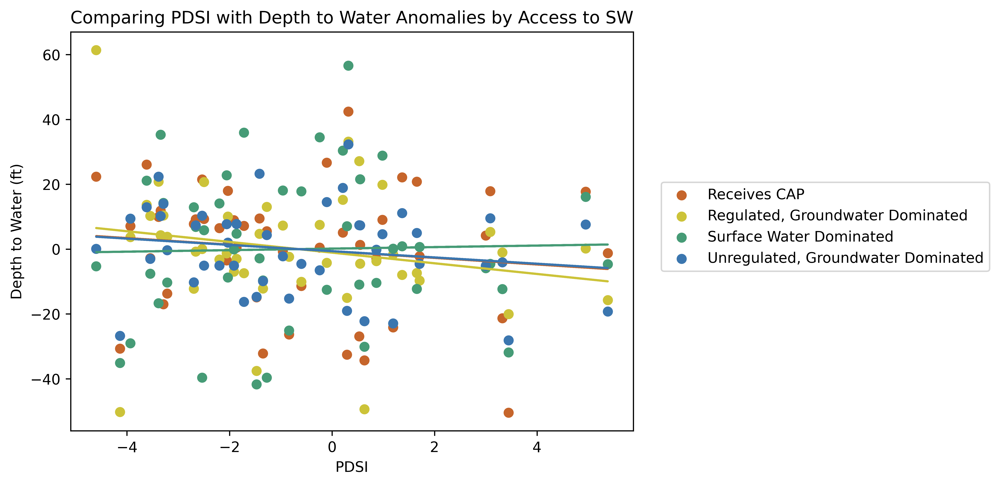

In [189]:
# %% Scatterplot of correlation values
ds = dtw_anomalys
name = 'Comparing PDSI with Depth to Water Anomalies by Access to SW'
# name = 'Comparing PDSI with Depth to Water by Regulation'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()
# betterlabels = ['Receives CAP (Regulated)','GW Dominated (Regulated)','Surface Water Dominated','GW Dominated','Mixed Source'] 
betterlabels = ['Receives CAP'
                ,'Regulated, Groundwater Dominated'
                ,'Surface Water Dominated'
                ,'Unregulated, Groundwater Dominated'
                # ,'Mixed \n GW/SW'
                ]
colors=[cap
        ,noCAP
        , swdom
        , GWdom
        # , mixed
        ]

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices['PDSI']
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel('PDSI')
ax.set_ylabel('Depth to Water (ft)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

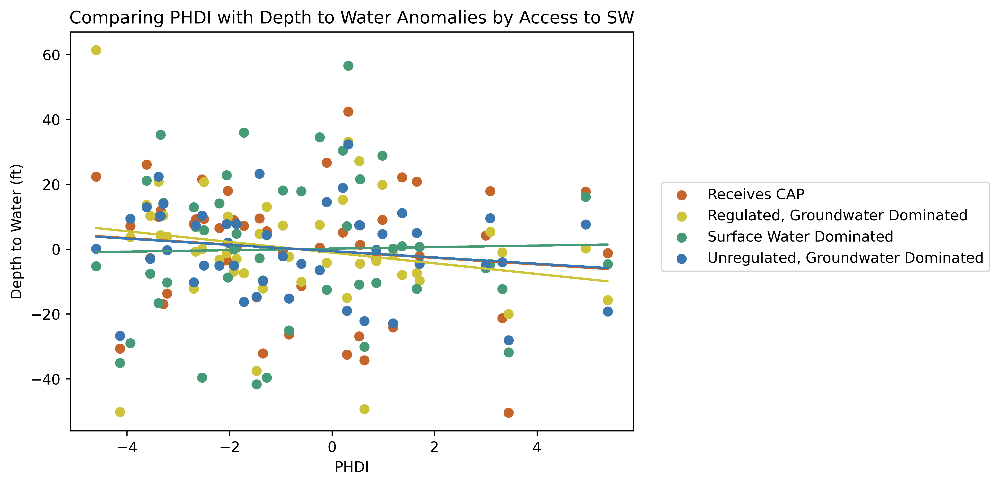

In [190]:
# %% Scatterplot of correlation values
ds = dtw_anomalys
name = 'Comparing PHDI with Depth to Water Anomalies by Access to SW'
# name = 'Comparing PDSI with Depth to Water by Regulation'
# del ds['Res']
columns = ds.columns
column_list = ds.columns.tolist()
# betterlabels = ['Receives CAP (Regulated)','GW Dominated (Regulated)','Surface Water Dominated','GW Dominated','Mixed Source'] 
betterlabels = ['Receives CAP'
                ,'Regulated, Groundwater Dominated'
                ,'Surface Water Dominated'
                ,'Unregulated, Groundwater Dominated'
                # ,'Mixed \n GW/SW'
                ]
colors=[cap
        ,noCAP
        , swdom
        , GWdom
        # , mixed
        ]

fig, ax = plt.subplots(figsize = (7,5))
x = drought_indices['PDSI']
for i,j,k in zip(column_list
                # ,reg_colors
                # , SW_colors
                , colors
                , betterlabels
                ):
        y = ds[i]
        ax.scatter(x,y
                , label=k
                , color=j
                )
        # Trendline: 1=Linear, 2=polynomial
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x, p(x),'-'
                , color=j
                # ,label=(k+' Trendline')
                )


ax.set_xlabel('PHDI')
ax.set_ylabel('Depth to Water (ft)')
ax.set_title(name,loc='center')
# ax.set_ylim(0,400)
fig.set_dpi(600)
plt.legend(loc = [1.05, 0.40])

plt.savefig(outputpath+name, bbox_inches='tight') 

Timeseries of DTW Anomalies

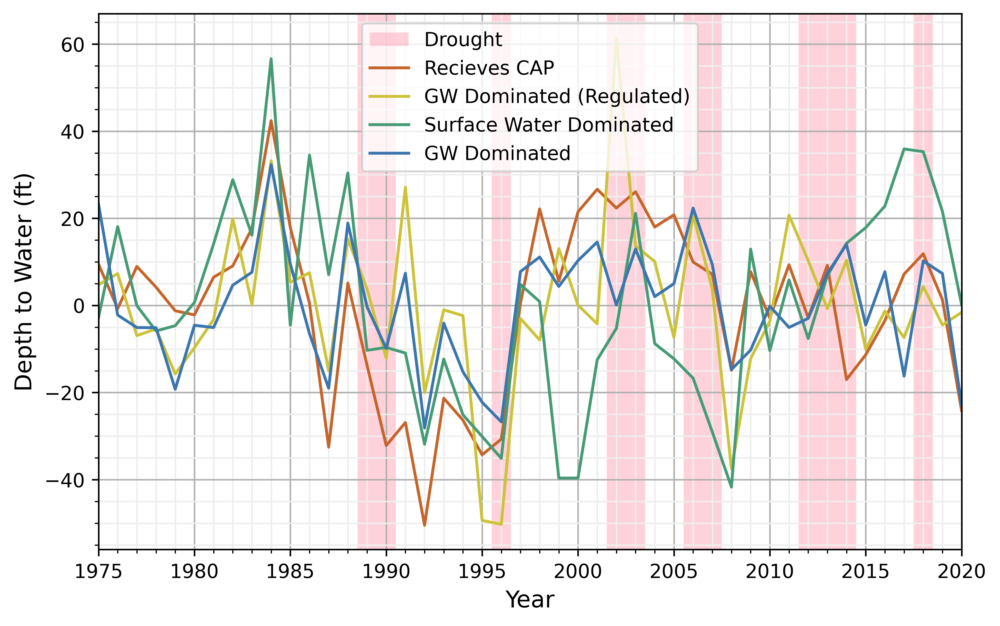

In [195]:
# For Depth to Water by SW Access
ds = dtw_anomalys
min_yr = 1975
mx_yr = 2020
betterlabels = ['Recieves CAP'
                ,'GW Dominated (Regulated)'
                ,'Surface Water Dominated'
                ,'GW Dominated'
                ,'Mixed Source'] 

fig, ax = plt.subplots(1, 1, figsize = (8,5))

# Drought Year Shading
a = 1988.5
b = 1990.5
c = 1995.5
d = 1996.5
# e = 1999.5
# f = 2000.5
g = 2001.5
h = 2003.5
i = 2005.5
j = 2007.5
k = 2011.5
l = 2014.5
m = 2017.5
n = 2018.5
plt.axvspan(a, b, color=drought_color, alpha=0.5, lw=0, label="Drought")
plt.axvspan(c, d, color=drought_color, alpha=0.5, lw=0)
# plt.axvspan(e, f, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(g, h, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(i, j, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(k, l, color=drought_color, alpha=0.5, lw=0)
plt.axvspan(m, n, color=drought_color, alpha=0.5, lw=0)

min_y = 75
max_y = 300
fsize = 12

ax.plot(ds['CAP'], label=betterlabels[0], color=cap,zorder=2)
ax.plot(ds['No_CAP'], label=betterlabels[1], color='#CCC339',zorder=2) 
ax.plot(ds['SW'], label=betterlabels[2], color=swdom,zorder=2) 
# ax.plot(ds['Mix'], label=betterlabels[4], color=mixed,zorder=2)
ax.plot(ds['GW'], label=betterlabels[3], color=GWdom,zorder=2)  

ax.set_xlim([min_yr,mx_yr])
# ax.set_ylim(min_y,max_y)
# ax.grid(True)
ax.grid(visible=True,which='major')
ax.grid(which='minor',color='#EEEEEE', lw=0.8)
ax.set_xlabel('Year', fontsize=fsize)
ax.set_ylabel('Depth to Water (ft)',fontsize=fsize)
ax.minorticks_on()
fig.set_dpi(600.0)
# ax.set_title('c)',fontsize = fsize,loc='left',pad=15)
ax.legend()

#Putting Grace on a secondary axis
# ax2 = ax.twinx()
# ax2.plot(grace_yearly['0'], label='State Average LWE', color='k',zorder=1)
# ax2.set_ylim([15, -15])
# ax2.set_ylabel(u'Δ LWE (cm)',fontsize=fsize)
# ax2.legend(loc='lower right')

plt.savefig(figurepath+'Figure7c', bbox_inches = 'tight')

Calculating the man anomalies per drought period

In [109]:
# %% Average Anomalie for drought periods
ds = dtw_anomalys.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'
# wlanalysis_period

for x,y in DROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)


dtw_mean_anomalies = ds.groupby(['Status']).mean()
dtw_mean_anomalies
# ds

,CAP,No_CAP,SW,GW,Mix
Status,,,,,
Drought 1,-22.941615,-4.161736,-9.974655,-5.094050,-25.930609
Drought 2,-30.694165,-50.250140,-35.115085,-26.731994,-23.333171
Drought 3,24.230759,37.525970,7.933524,6.517481,22.611832
Drought 4,8.558030,12.263032,-22.858926,15.881460,4.182702
Drought 5,-3.535056,6.641096,4.506369,6.122813,9.775500
Drought 6,11.860823,4.311152,35.300205,10.205800,4.152200
Normal-Wet,0.278405,-1.863967,1.031311,-1.041486,-0.339239


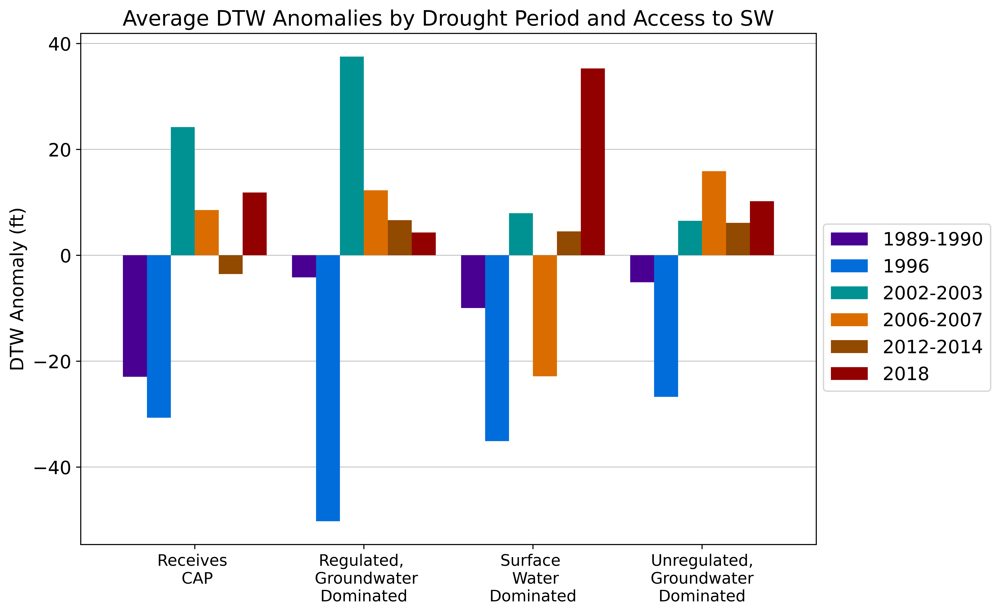

In [110]:
#%% Grouped Bar chart for drawdown (ft)
# name = 'Average DTW Anomalies by Drought Period and Groundwater Regulation'
name = 'Average DTW Anomalies by Drought Period and Access to SW'

yearlabels = ["1989-1990",'1996','2002-2003','2006-2007','2012-2014','2018','Normal/Wet Years']
betterlabels = ['Receives \n CAP'
                ,'Regulated, \n Groundwater\nDominated'
                ,'Surface \n Water\nDominated'
                ,'Unregulated,\nGroundwater\nDominated'
                # ,'Mixed \n GW/SW'
                ] 
# betterlabels = ['Regulated','Unregulated']

dtw_mean_anomalies.index = yearlabels
del dtw_mean_anomalies['Mix']
dtw_mean_anomalies = dtw_mean_anomalies.transpose()

dtw_mean_anomalies.index = betterlabels
del dtw_mean_anomalies['Normal/Wet Years']
dtw_mean_anomalies


# group_colors = ['lightsalmon','tomato','orangered','r','brown','indianred','steelblue']

group_colors = [blind[5],blind[6],blind[2]
                ,blind[12],blind[11],blind[10]
                # ,blind[0] #black
                ]

horlabel = 'DTW Anomaly (ft)'
fsize = 14

plt.rcParams["figure.dpi"] = 600
dtw_mean_anomalies.plot(figsize = (10,7),
        kind='bar',
        stacked=False,
        # title=name,
        color = group_colors,
        zorder = 2,
        width = 0.85,
        fontsize = fsize
        )
plt.title(name, fontsize = (fsize+2))
# plt.ylim([0,400])
plt.ylabel(horlabel, fontsize = fsize)
plt.xticks(rotation=0, fontsize = fsize-2)
plt.grid(axis='y', linewidth=0.5, zorder=0)
plt.legend(loc=[1.01,0.3],fontsize = fsize)
# plt.set_dpi(600)

plt.savefig(figurepath+name+'_groupedchart', bbox_inches = 'tight')
# plt.savefig(outputpath+name+'_anomalies_SWAccess_groupedchart', bbox_inches = 'tight')

Calculating Drawdown agains the trend

In [124]:
# Reworking drought

# %% Max drawdown
ds = wlanalysis_period.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'
# wlanalysis_period
trend_drought = trend_df.copy()
for x,y in DROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)
        trend_drought.loc[y, 'Status'] = 'Drought '+str(x)

drought_max = ds.groupby(['Status']
                        #  ,as_index=False
                         ).max()
drought_max

,CAP,No_CAP,SW,GW,Mix
Status,,,,,
Drought 1,179.457085,185.188335,117.531488,175.238597,104.284175
Drought 2,168.560270,149.850086,100.389946,162.618822,121.260878
Drought 3,231.442849,277.514565,166.354509,216.107231,186.951107
Drought 4,217.922892,247.637147,132.684885,231.421548,175.970707
Drought 5,223.243659,258.584721,174.755648,238.840315,204.237345
Drought 6,230.256297,263.226126,201.330124,242.929449,198.627974
Normal-Wet,231.224522,262.661556,200.566648,242.020645,244.657658


In [127]:
drought_max.index

Index(['Drought 1', 'Drought 2', 'Drought 3', 'Drought 4', 'Drought 5',
       'Drought 6', 'Normal-Wet'],
      dtype='object', name='Status')

In [130]:
drought_max

,CAP,No_CAP,SW,GW,Mix
Status,,,,,
Drought 1,179.457085,185.188335,117.531488,175.238597,104.284175
Drought 2,168.560270,149.850086,100.389946,162.618822,121.260878
Drought 3,231.442849,277.514565,166.354509,216.107231,186.951107
Drought 4,217.922892,247.637147,132.684885,231.421548,175.970707
Drought 5,223.243659,258.584721,174.755648,238.840315,204.237345
Drought 6,230.256297,263.226126,201.330124,242.929449,198.627974
Normal-Wet,231.224522,262.661556,200.566648,242.020645,244.657658


In [144]:
drought_max = drought_max.copy()
# droughtnumlist = drought_max.index()

for i in column_list:
    droughtvalues = drought_max[i].tolist()
    # print(droughtvalues)
    print(i)
    dummylist = []
    for wl in droughtvalues:
        maxyear = ds.index[ds[i]==wl]
        maxyear = maxyear.tolist()
        # print(maxyear)
        trend_value = trend_drought.loc[maxyear,i]
        # print(trend_value)
        dd = wl - trend_value
        dd = dd.tolist()
        # print(dd)
        dummylist.append(dd[0])

        # drawdown_trend.loc[i,droughtnum] = dd
        # print("dummy list: ",dummylist)
    drought_max[i] = dummylist

drought_max = drought_max[:-1]
drought_max

CAP
No_CAP
SW
GW
Mix


,CAP,No_CAP,SW,GW,Mix
Status,,,,,
Drought 1,-13.707020,3.801893,-9.648573,-0.311773,-24.438415
Drought 2,-30.694165,-50.250140,-35.115085,-26.731994,-23.333171
Drought 3,26.098083,61.373953,21.137013,12.955968,26.485600
Drought 4,9.967984,20.802945,-16.695095,22.355808,6.435795
Drought 5,9.198421,10.363337,14.275708,14.002636,18.830975
Drought 6,11.860823,4.311152,35.300205,10.205800,4.152200


Finding the corresponding values on the trendline

In [77]:
max_years = drought_max['index'].to_list()
max_years

for y in max_years:
    trend_drought.loc[y, 'max'] = y
trend_drought_max = trend_drought.groupby(['max']).max()
trend_drought_max = trend_drought_max[:-1]
trend_drought_max = trend_drought_max.set_index('Status')
trend_drought_max

,R,U
Status,,


Reformatting the max drawdown values

In [ ]:
drought_max = drought_max.set_index('Status')
del drought_max['index']
drought_max = drought_max[:-1]
drought_max

,R,U
Status,,
Drought 1,180.712773,159.418976
Drought 2,164.610175,151.940624
Drought 3,238.270432,209.671952
Drought 4,224.220432,217.820875
Drought 5,227.468807,228.765211
Drought 6,238.833255,235.502765


Now actually calculating drawdown against the corresponding trend values

In [ ]:
drought_max = drought_max - trend_drought_max
drought_max

,R,U
Status,,
Drought 1,-10.268658,-7.913709
Drought 2,-34.211052,-27.311164
Drought 3,30.302775,16.514545
Drought 4,11.026244,16.717400
Drought 5,5.128190,13.756117
Drought 6,11.266108,12.547603


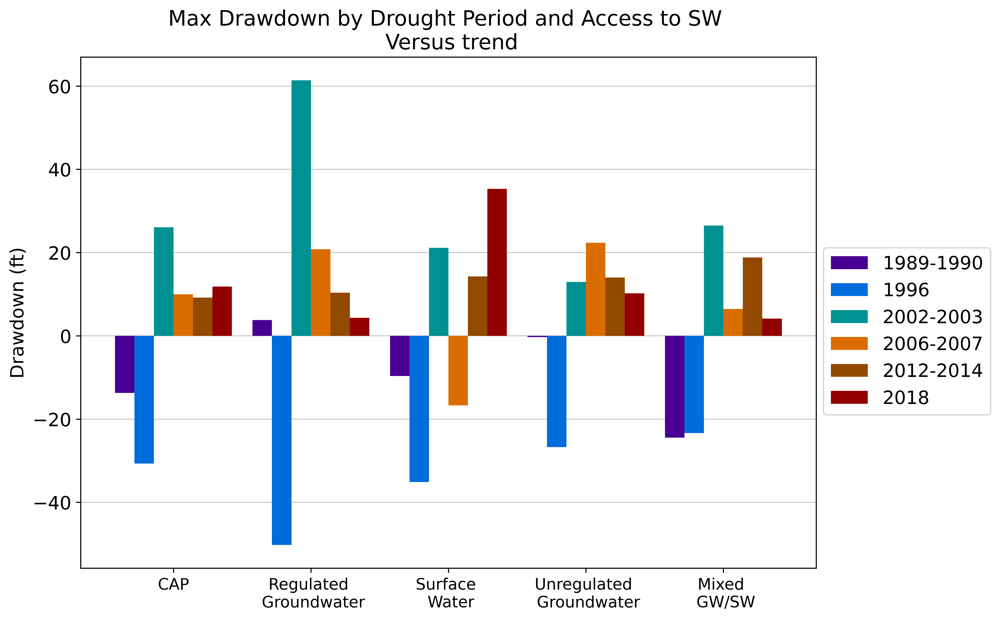

In [145]:
#%% Grouped Bar chart for drawdown (ft)
name = 'Max Drawdown by Drought Period and Access to SW \n Versus trend'
# name = 'Max Drawdown by Drought Period and Access to SW'

yearlabels = ["1989-1990",'1996','2002-2003','2006-2007','2012-2014','2018']
betterlabels = ['CAP','Regulated \n Groundwater','Surface \n Water','Unregulated \n Groundwater','Mixed \n GW/SW'] 
# betterlabels = ['Regulated','Unregulated']

drought_max.index = yearlabels
drought_max = drought_max.transpose()
drought_max
drought_max.index = betterlabels
# del drawdown['Normal/Wet Years']

# group_colors = ['lightsalmon','tomato','orangered','r','brown','indianred','steelblue']

group_colors = [blind[5],blind[6],blind[2]
                ,blind[12],blind[11],blind[10]
                # ,blind[0] #black
                ]

horlabel = 'Drawdown (ft)'
fsize = 14

plt.rcParams["figure.dpi"] = 600
drought_max.plot(figsize = (10,7),
        kind='bar',
        stacked=False,
        # title=name,
        color = group_colors,
        zorder = 2,
        width = 0.85,
        fontsize = fsize
        )
plt.title(name, fontsize = (fsize+2))
# plt.ylim([0,400])
plt.ylabel(horlabel, fontsize = fsize)
plt.xticks(rotation=0, fontsize = fsize-2)
plt.grid(axis='y', linewidth=0.5, zorder=0)
plt.legend(loc=[1.01,0.3],fontsize = fsize)
# plt.set_dpi(600)

plt.savefig(figurepath+name+'_groupedchart', bbox_inches = 'tight')
# plt.savefig(outputpath+name+'_anomalies_SWAccess_groupedchart', bbox_inches = 'tight')

For Drawdown

In [35]:
# %% Max drawdown
ds = wlanalysis_period.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'
# wlanalysis_period

for x,y in DROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)


drought_max = ds.groupby(['Status']).max()
drought_max
# ds

,CAP,No_CAP,SW,GW,Mix
Status,,,,,
Drought 1,179.457085,185.188335,117.531488,175.238597,104.284175
Drought 2,168.560270,149.850086,100.389946,162.618822,121.260878
Drought 3,231.442849,277.514565,166.354509,216.107231,186.951107
Drought 4,217.922892,247.637147,132.684885,231.421548,175.970707
Drought 5,223.243659,258.584721,174.755648,238.840315,204.237345
Drought 6,230.256297,263.226126,201.330124,242.929449,198.627974
Normal-Wet,231.224522,262.661556,200.566648,242.020645,244.657658


This is for calculating against the average for Normal-Wet periods

In [36]:
# Predrought values
ds = wlanalysis_period.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'

for x,y in PREDROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)

ds
predrought = ds.groupby(['Status']).mean()
predrought

,CAP,No_CAP,SW,GW,Mix
Status,,,,,
Drought 1,192.356553,161.694185,126.855081,160.593119,115.722992
Drought 2,164.960785,191.685594,110.591664,172.434269,121.905402
Drought 3,213.845172,207.315333,120.571103,202.663603,147.757996
Drought 4,224.208520,231.566527,137.839894,207.147709,149.745024
Drought 5,211.110092,226.396986,135.180745,214.338414,166.749471
Drought 6,208.809954,246.557291,182.885717,229.399334,216.526580
Normal-Wet,206.617611,225.551805,151.510964,207.084121,165.186791


Now for calculating against the slope

In [38]:
# Predrought values
import pandas as pd
ds = wlanalysis_period.copy()
columns = ds.columns
column_list = ds.columns.tolist()

labels = column_list
stats = pd.DataFrame()
for i in column_list:
        df = ds[i]
        # df = f[i].pct_change()
        #print(df)
        y=np.array(df.values, dtype=float)
        x=np.array(pd.to_datetime(df).index.values, dtype=float)
        slope, intercept, r_value, p_value, std_err =sp.linregress(x,y)
        stats = stats._append({'slope': slope,
                               'int':intercept
                        },
                        ignore_index=True)


stats.index = labels
stats1 = stats.transpose()
stats1

,CAP,No_CAP,SW,GW,Mix
slope,0.870047,2.673398,1.387495,1.971492,2.267351
int,-1537.359728,-5136.001492,-2633.934803,-3745.747980,-4381.038885


In [39]:
# Predrought values
ds = wlanalysis_period.copy()
columns = ds.columns
column_list = ds.columns.tolist()

ds['Status'] = 'Normal-Wet'

for x,y in PREDROUGHT_YEARS.items():
        ds.loc[y, 'Status'] = 'Drought '+str(x)

ds
# predrought = ds.groupby(['Status']).mean()
# predrought

,CAP,No_CAP,SW,GW,Mix,Status
index,,,,,,
1975,190.473297,148.710846,103.550318,171.201327,128.051721,Drought 1
1976,181.111237,153.933174,125.844268,147.710038,109.477386,Drought 1
1977,191.665817,142.382232,109.087632,146.813494,93.044687,Drought 1
1978,187.774087,146.579085,104.664207,148.741035,99.130440,Drought 1
1979,183.231566,138.923166,107.257176,136.578601,108.951202,Drought 1
1980,183.161669,147.605201,113.974432,153.251333,106.176942,Drought 1
1981,192.673196,156.769234,128.793260,154.702430,127.215743,Drought 1
1982,196.143852,182.536815,144.924079,166.395900,127.793003,Drought 1
1983,205.653130,165.541254,133.593669,171.346254,142.095779,Drought 1


In [40]:
# ds = predrought
predrought_slope = ds.copy()
for i in column_list:
    print(i)
    m = stats1.loc['slope',i]
    b = stats1.loc['int',i]
    x = predrought_slope[i].index*m + b
    # print(x)
    predrought_slope[i] = x
#     predrought_slope = predrought_slope._append(x)

predrought_slope
    

CAP
No_CAP
SW
GW
Mix


,CAP,No_CAP,SW,GW,Mix,Status
index,,,,,,
1975,180.983445,143.958875,106.367638,147.949476,96.979674,Drought 1
1976,181.853492,146.632273,107.755133,149.920969,99.247026,Drought 1
1977,182.723539,149.305671,109.142628,151.892461,101.514377,Drought 1
1978,183.593587,151.979068,110.530123,153.863954,103.781728,Drought 1
1979,184.463634,154.652466,111.917617,155.835446,106.049079,Drought 1
1980,185.333681,157.325864,113.305112,157.806938,108.316430,Drought 1
1981,186.203728,159.999261,114.692607,159.778431,110.583781,Drought 1
1982,187.073775,162.672659,116.080102,161.749923,112.851133,Drought 1
1983,187.943822,165.346056,117.467597,163.721416,115.118484,Drought 1


In [41]:
predrought = predrought_slope.groupby(['Status']).mean()
predrought

,CAP,No_CAP,SW,GW,Mix
Status,,,,,
Drought 1,186.203728,159.999261,114.692607,159.778431,110.583781
Drought 2,196.209271,190.743334,130.648799,182.450593,136.658320
Drought 3,201.429554,206.783720,138.973768,194.279547,150.262427
Drought 4,206.214813,221.487407,146.604990,205.122756,162.732858
Drought 5,209.695002,232.180998,152.154970,213.008725,171.802263
Drought 6,216.220356,252.231480,162.561182,227.794918,188.807397
Normal-Wet,207.494294,225.418874,148.645424,208.022009,166.067198


In [45]:
# %% Drawdown
drawdown = drought_max - predrought
# del drawdown['Status']
drawdown

,CAP,No_CAP,SW,GW,Mix
Status,,,,,
Drought 1,-6.746643,25.189074,2.838881,15.460166,-6.299606
Drought 2,-27.649000,-40.893248,-30.258853,-19.831771,-15.397442
Drought 3,30.013295,70.730845,27.380740,21.827684,36.688680
Drought 4,11.708078,26.149740,-13.920105,26.298793,13.237849
Drought 5,13.548657,26.403723,22.600678,25.831590,32.435082
Drought 6,14.035941,10.994646,38.768942,15.134531,9.820578
Normal-Wet,23.730228,37.242681,51.921225,33.998636,78.590460


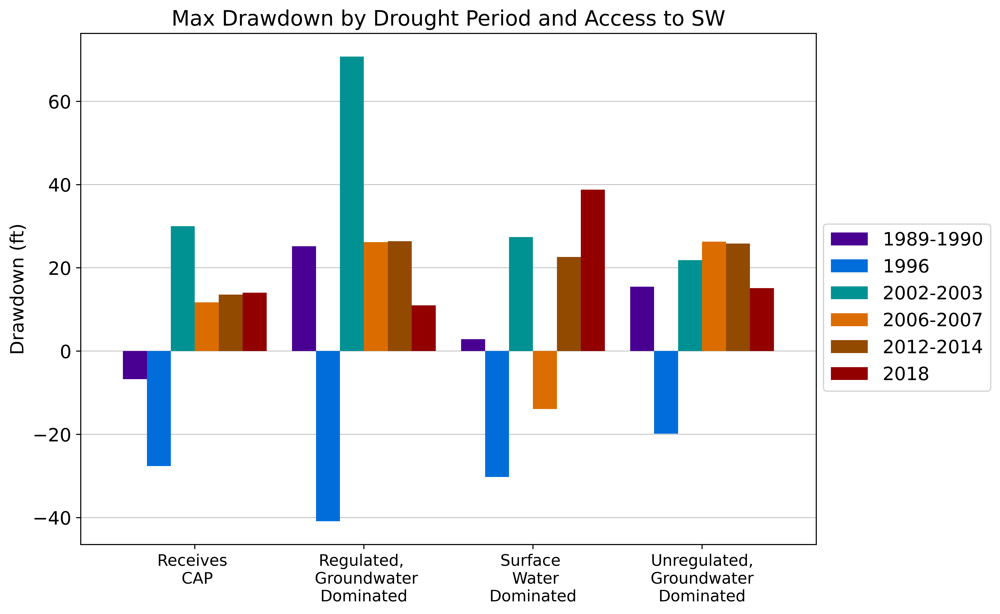

In [46]:
#%% Grouped Bar chart for drawdown (ft)
# name = 'Max Drawdown by Drought Period and Groundwater Regulation'
name = 'Max Drawdown by Drought Period and Access to SW'

yearlabels = ["1989-1990",'1996','2002-2003','2006-2007','2012-2014','2018','Normal/Wet Years']
betterlabels = ['Receives \n CAP'
                ,'Regulated, \n Groundwater\nDominated'
                ,'Surface \n Water\nDominated'
                ,'Unregulated,\nGroundwater\nDominated'
                # ,'Mixed \n GW/SW'
                ] 
# betterlabels = ['Regulated','Unregulated']

drawdown.index = yearlabels
del drawdown['Mix']
drawdown = drawdown.transpose()

drawdown.index = betterlabels
del drawdown['Normal/Wet Years']

ds = pd.DataFrame

# group_colors = ['lightsalmon','tomato','orangered','r','brown','indianred','steelblue']

group_colors = [blind[5],blind[6],blind[2]
                ,blind[12],blind[11],blind[10]
                # ,blind[0] #black
                ]

horlabel = 'Drawdown (ft)'
fsize = 14

plt.rcParams["figure.dpi"] = 600
drawdown.plot(figsize = (10,7),
        kind='bar',
        stacked=False,
        # title=name,
        color = group_colors,
        zorder = 2,
        width = 0.85,
        fontsize = fsize
        )
plt.title(name, fontsize = (fsize+2))
# plt.ylim([0,400])
plt.ylabel(horlabel, fontsize = fsize)
plt.xticks(rotation=0, fontsize = fsize-2)
plt.grid(axis='y', linewidth=0.5, zorder=0)
plt.legend(loc=[1.01,0.3],fontsize = fsize)
# plt.set_dpi(600)

plt.savefig(figurepath+name+'_groupedchart', bbox_inches = 'tight')
# plt.savefig(outputpath+name+'_anomalies_SWAccess_groupedchart', bbox_inches = 'tight')